In [1]:
!git clone https://github.com/THU-MIG/yolov10.git
%cd yolov10

e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10


fatal: destination path 'yolov10' already exists and is not an empty directory.
e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolo_license_plate\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
!pip install -q .


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import os
import urllib.request
#Create a directory for the weights in the current working directory
weights_dir = os.path.join(os.getcwd(), 'weights')
os.makedirs(weights_dir, exist_ok = True)
#urls of the weights file
urls = ["https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt"]

#Download each file
for url in urls:
  filename = os.path.basename(url)
  filepath = os.path.join(weights_dir, filename)
  urllib.request.urlretrieve(url, filepath)
  print(f"Downloaded: {filepath}")

Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10n.pt
Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10s.pt
Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10m.pt
Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10b.pt
Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10l.pt
Downloaded: e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\weights\yolov10x.pt


In [4]:
# !pip install roboflow

In [5]:
from roboflow import Roboflow

rf = Roboflow(api_key="8joVH7TL2k5V6uScFBEy")
project = rf.workspace("moin").project("car_license_plates")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


In [6]:
%cd '/content/yolov10'

[WinError 3] The system cannot find the path specified: "'/content/yolov10'"
e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10


This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.


In [13]:
!yolo task=detect mode=train epochs=120 batch=16 plots=True model='weights/yolov10n.pt' data='Car_License_Plates-2/data.yaml'

New https://pypi.org/project/ultralytics/8.3.34 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.12.6 torch-2.5.1+cpu CPU (12th Gen Intel Core(TM) i5-12500H)
engine\trainer: task=detect, mode=train, model=weights/yolov10n.pt, data=Car_License_Plates-2/data.yaml, epochs=120, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=

E:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolo_license_plate\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimenta

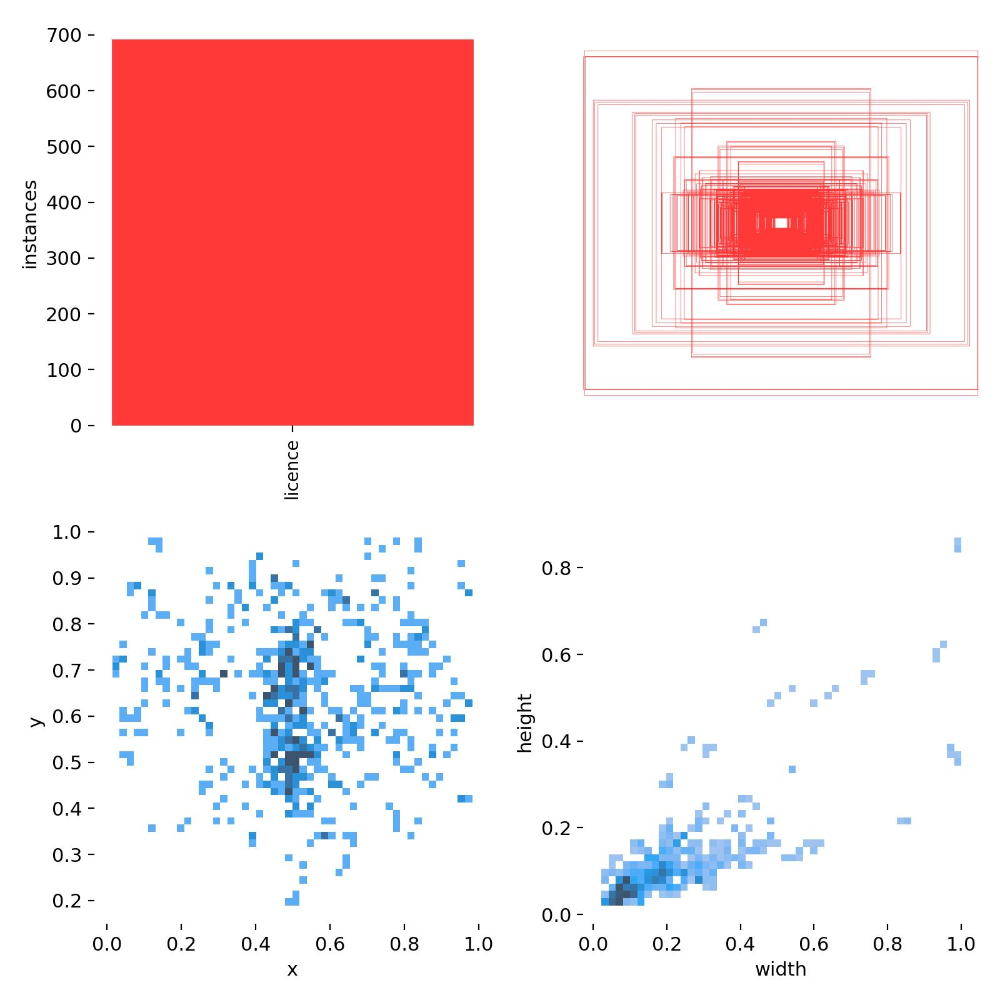

In [8]:
from IPython.display import Image

Image("runs/detect/train6/labels.jpg")

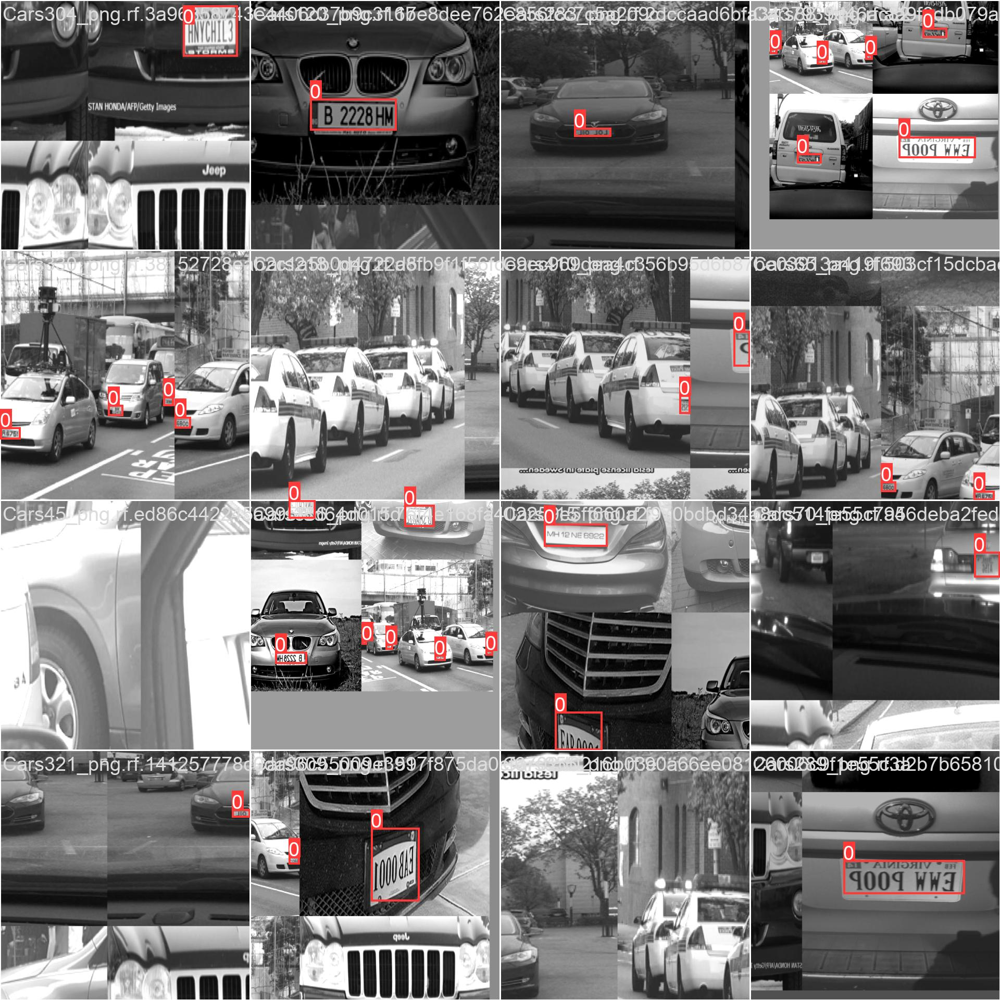

In [9]:
Image("runs/detect/train6/train_batch0.jpg")

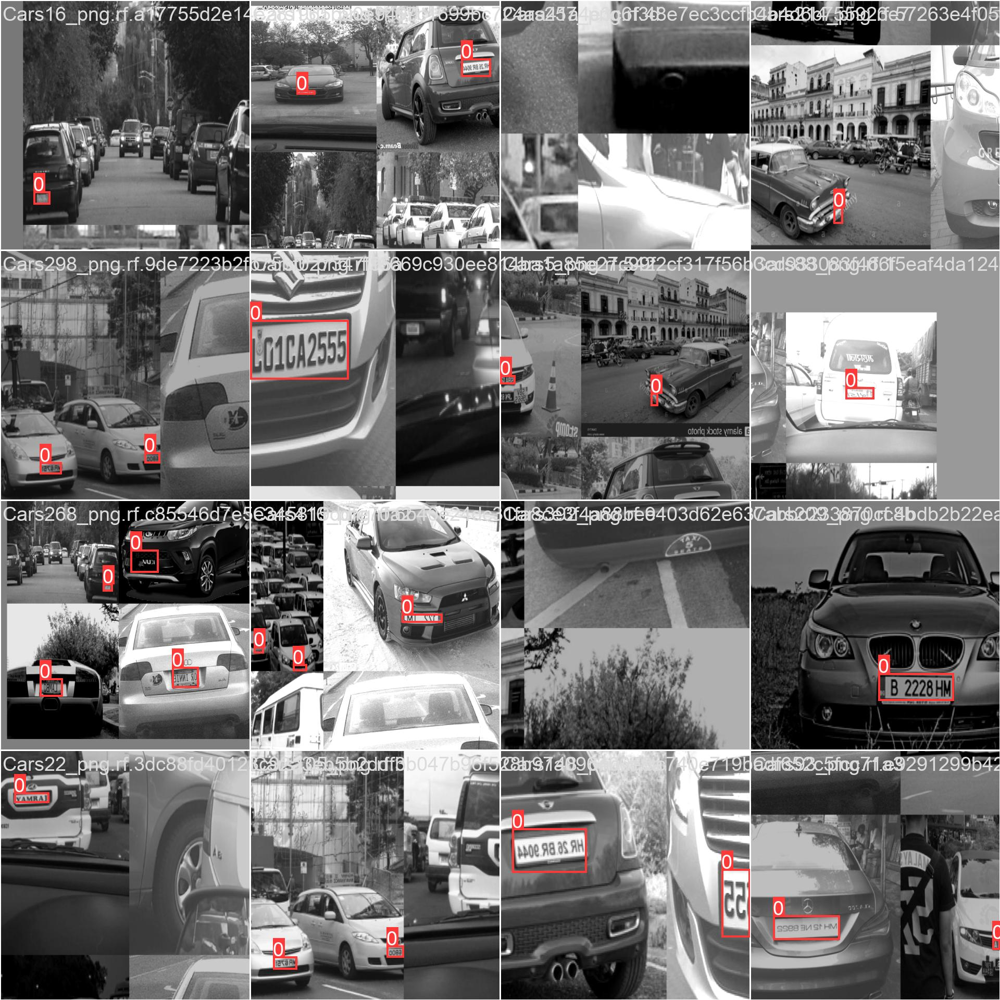

In [10]:
Image("runs/detect/train6/train_batch1.jpg")

In [15]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict5/demo.avi'

# Compressed video path
compressed_path = "demo.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [16]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='1.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.12.6 torch-2.5.1+cpu CPU (12th Gen Intel Core(TM) i5-12500H)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 licence, 78.4ms
video 1/1 (frame 2/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 licence, 72.0ms
video 1/1 (frame 3/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 licence, 75.6ms
video 1/1 (frame 4/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 licence, 67.1ms
video 1/1 (frame 5/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 licence, 72.8ms
video 1/1 (frame 6/140) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\1.mp4: 384x640 1 lic

E:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolo_license_plate\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimenta

In [17]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='demo.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.12.6 torch-2.5.1+cpu CPU (12th Gen Intel Core(TM) i5-12500H)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\demo.mp4: 416x640 1 licence, 86.4ms
video 1/1 (frame 2/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\demo.mp4: 416x640 2 licences, 68.6ms
video 1/1 (frame 3/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\demo.mp4: 416x640 3 licences, 88.7ms
video 1/1 (frame 4/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\demo.mp4: 416x640 2 licences, 86.9ms
video 1/1 (frame 5/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\demo.mp4: 416x640 1 licence, 78.3ms
video 1/1 (frame 6/631) e:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolov10\de

E:\Data Science & AI\Resume Projects\Licence Plate Detection Using YOLOv9\yolo_license_plate\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimenta